In [31]:
from utils.face_recognition import FaceDetector, allign_faces, get_embeddings, load_facenet_model, load_insightface_model

import torch as th
import numpy as np 
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import torchvision.transforms as VT

In [32]:
INSIGHTFACE_WEIGHTS_DIR = Path().absolute().parent / "thirdparty/recognition/weights"
insightface_weights_paths = list(INSIGHTFACE_WEIGHTS_DIR.glob("*.pth"))

In [33]:
from collections import defaultdict

DATA_DIR = Path().absolute().parent / "data"

parameter2intensity2image = defaultdict(dict)
for path in (DATA_DIR / "ck_faces").rglob("*_*.png"):
    intensity = path.stem.split("_")[-1]
    parameter = "-".join(path.stem.split("_")[0: -1])
    image = np.array(Image.open(path))

    print(parameter, intensity)
    parameter2intensity2image[parameter][intensity] = image


nose-height-male big
nose-height tiny
nose-height-male tiny
test-nose target
nose-forward target
nose-forward big
nose-height target
nose-forward tiny
nose-height-male target
test-nose big
nose-height big
mouth-height target
mouth-height big
mouth-height tiny
ear-size big
ear-size tiny
ear-size target
lower-lip-fullness target
lower-lip-fullness big
lower-lip-fullness tiny
chin-height big
chin-height tiny
chin-height target
eye-depth tiny
eye-depth big
eye-depth target
hair target
hair big


# Detect and allign faces

In [34]:
detector = FaceDetector()

/Users/czyjtu/dev/MP2023/venv/lib/python3.10/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:54: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /Users/czyjtu/.insightface/models/antelopev2/1k3d68.onnx landmark_3d_68
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /Users/czyjtu/.insightface/models/antelopev2/2d106det.onnx landmark_2d_106
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /Users/czyjtu/.insightface/models/antelopev2/genderage.onnx genderage
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /Users/czyjtu/.insightface/models/antelopev2/glintr100.onnx recognition
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /Users/czyjtu/.insightface/models/antelopev2/scrfd_10g_bnkps.onnx detection [1, 3, '?', '?'] 127.5 128.0
set det-size: (640, 640)


In [35]:
parameter2intensity2alligned = defaultdict(dict)
for parameter, intensity2image in parameter2intensity2image.items():
    for intensity, image in intensity2image.items():
        alligned_image = detector(image)
        parameter2intensity2alligned[parameter][intensity] = alligned_image

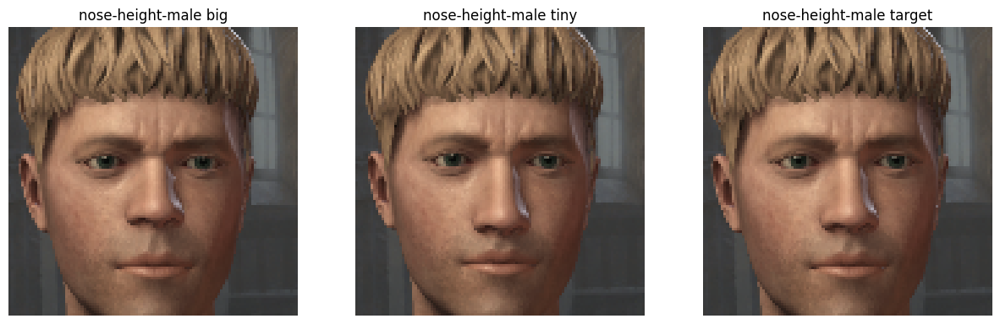

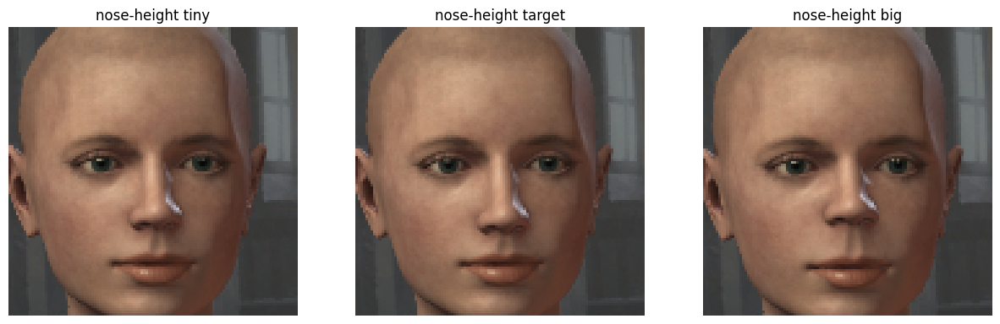

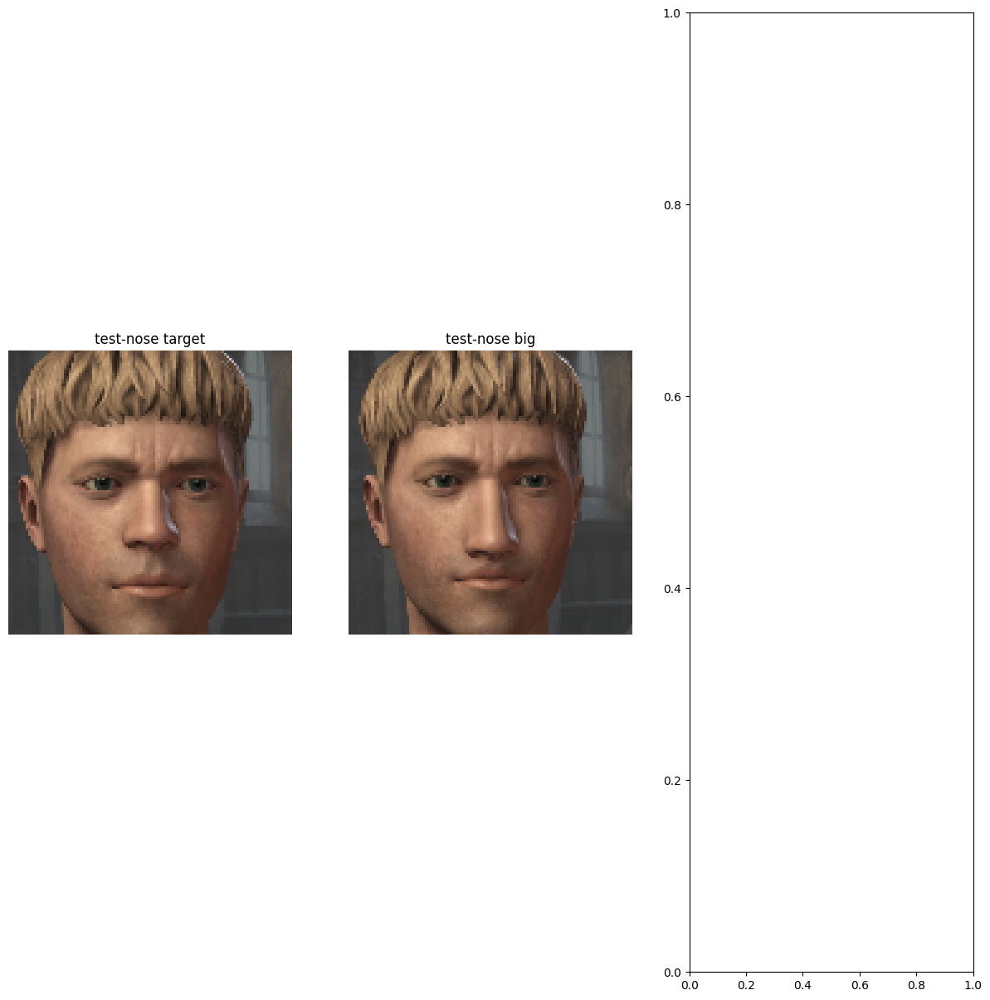

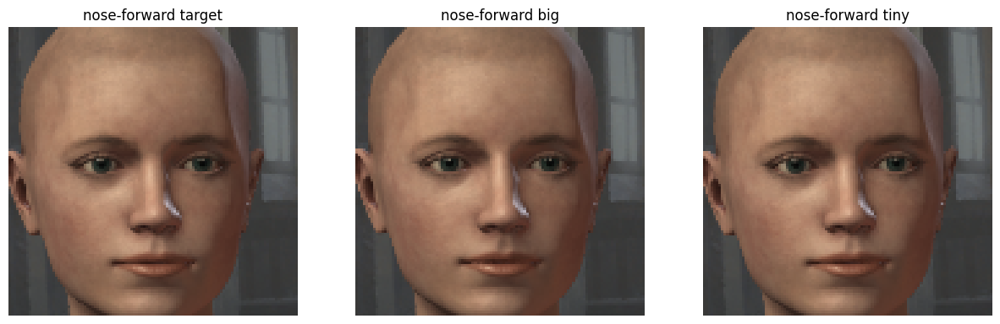

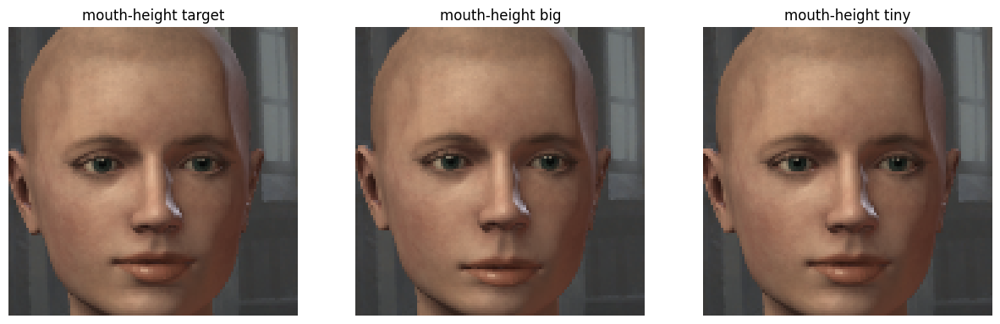

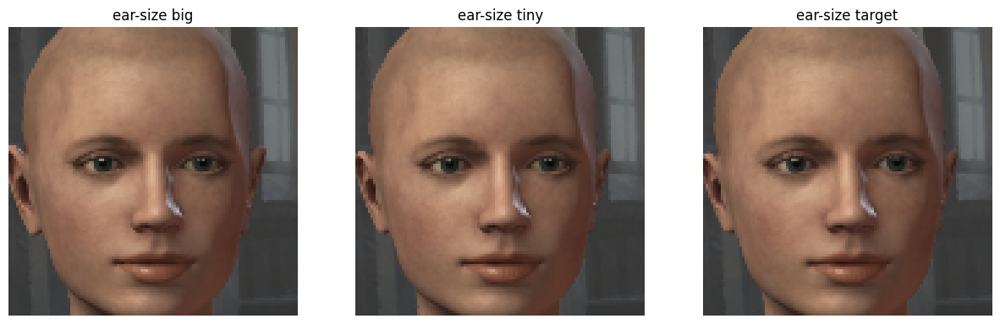

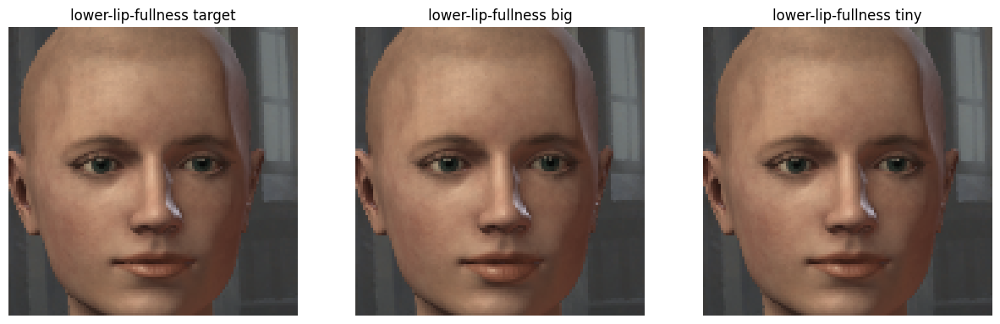

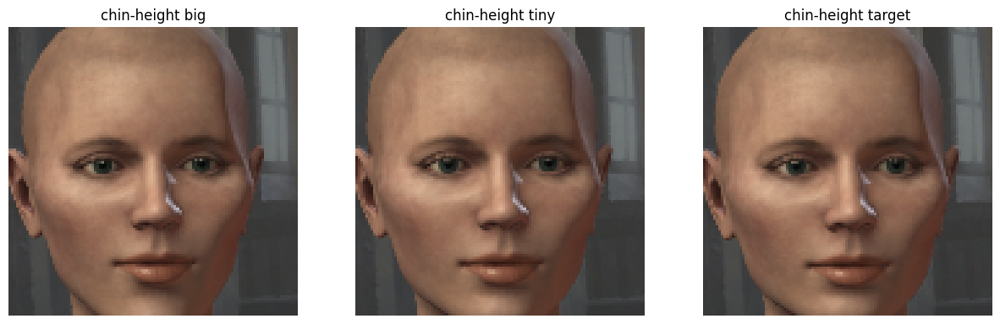

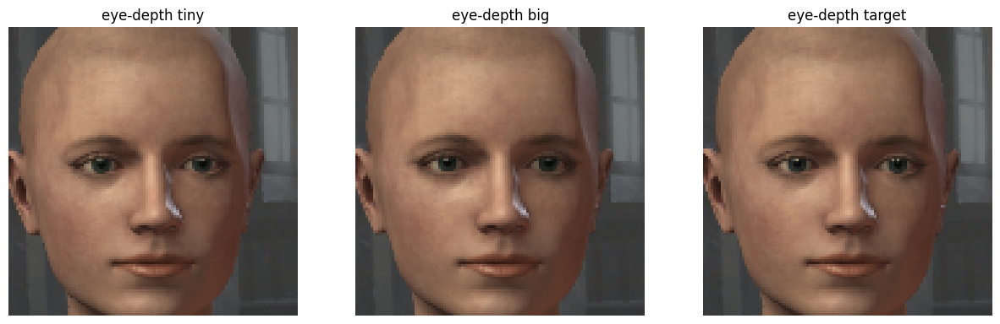

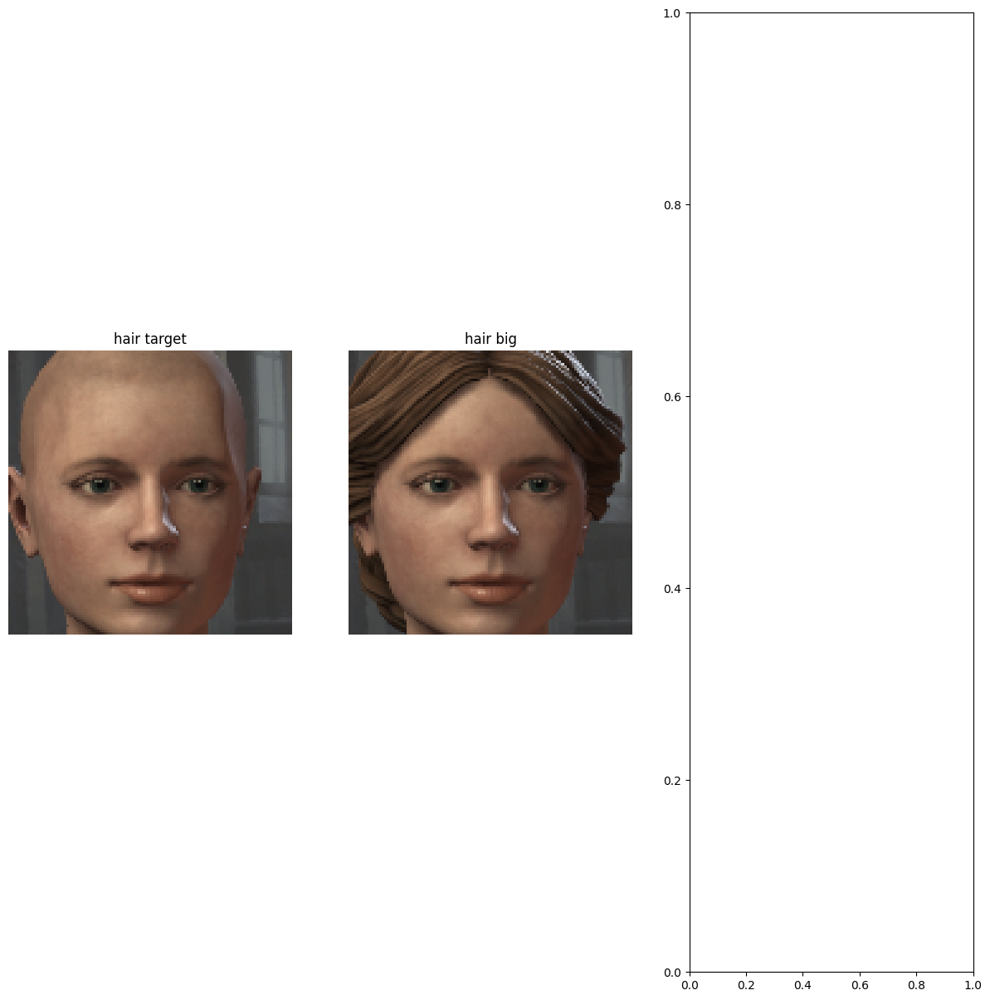

In [36]:
for parameter, intensity2image in parameter2intensity2alligned.items():
    fig, axs = plt.subplots(int(np.ceil(len(intensity2image) / 3)), 3, figsize=(15, 15))
    for ax, (intensity, img) in zip(axs.flatten(), intensity2image.items()):
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"{parameter} {intensity}")
    plt.show()

## Compute gradients

In [37]:
import cv2 

def preprocess_alligned_image(img):
    transform = VT.Compose([
        VT.ToTensor(),
        VT.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])

    resized_rgb = cv2.resize(img, (112, 112))
    float_img = np.float32(resized_rgb) / 255.0
    return float_img, transform(float_img)


parameter2intensity2preprocessed = defaultdict(dict)
for parameter, intensity2image in parameter2intensity2alligned.items():
    for intensity, image in intensity2image.items():
        float_image, tensor = preprocess_alligned_image(image)
        parameter2intensity2preprocessed[parameter][intensity] = (float_image, tensor)

In [38]:
models_factory = {
    "-".join(path.parts[-1].split(".")[0].split("_")): lambda: load_insightface_model(str(path)) for path in insightface_weights_paths
}
# models_factory |= {
#     label: lambda: load_facenet_model(label) for label in ["casia-webface", "vggface2"]
# }
models_factory.keys()

dict_keys(['cosface-r34', 'arcface-r50', 'cosface-r18', 'arcface-r18', 'cosface-r50', 'arcface-r34', 'cosface-r100', 'arcface-r100'])

In [46]:
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from pytorch_grad_cam import GradCAM
from tqdm import tqdm 

class SimilarityToConceptTarget:
    def __init__(self, features):
        self.features = features
    
    def __call__(self, model_output):
        cos = th.nn.MSELoss()
        s =  cos(model_output, self.features)
        return s
    
models2parameter2intensity2gradients = defaultdict(dict)
images = []
for model_name, model_factory in tqdm(list(models_factory.items())):
    model = model_factory()
    model.eval()

    for parameter, intensity2images in parameter2intensity2preprocessed.items():
        float_target, target = intensity2images["target"]
        models2parameter2intensity2gradients[(model_name, parameter)]["target"] = float_target
        for intensity, (float_image, tensor) in intensity2images.items():
            if intensity == "target":
                continue
            with GradCAM(
                model=model,
                target_layers=[model.layer4[-1]],
                use_cuda=False
            ) as cam:
                cam_image = cam(
                    input_tensor=tensor.unsqueeze(0),
                    targets=[SimilarityToConceptTarget(model(target.unsqueeze(0))[0, :])]
                )[0, :]
                images.append(Image.fromarray(cam_image))
                models2parameter2intensity2gradients[(model_name, parameter)][intensity] = show_cam_on_image(float_image, cam_image, use_rgb=True)

100%|██████████| 8/8 [01:13<00:00,  9.23s/it]


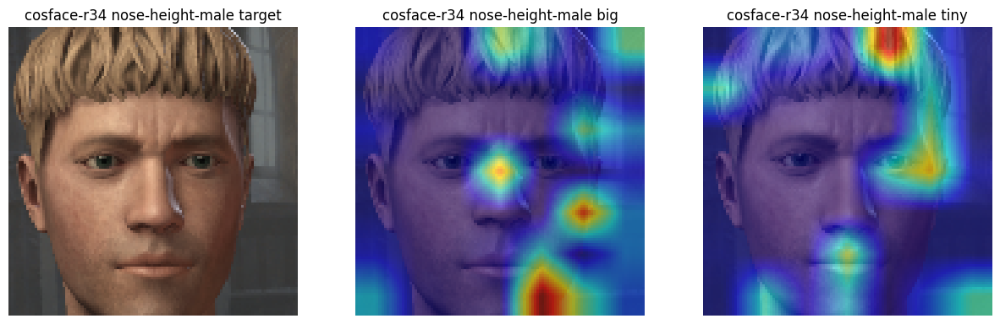

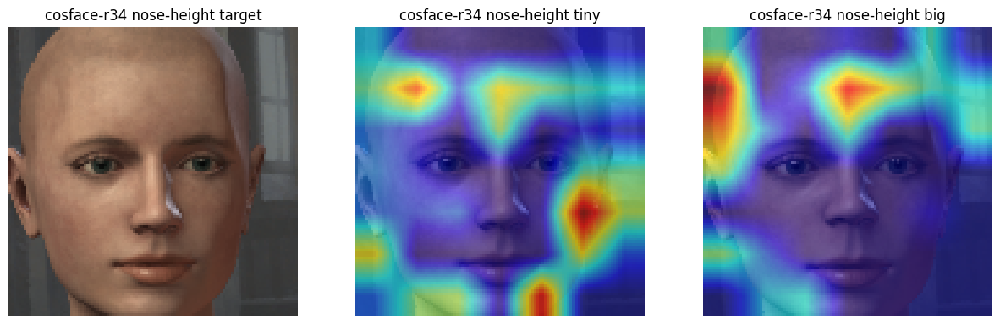

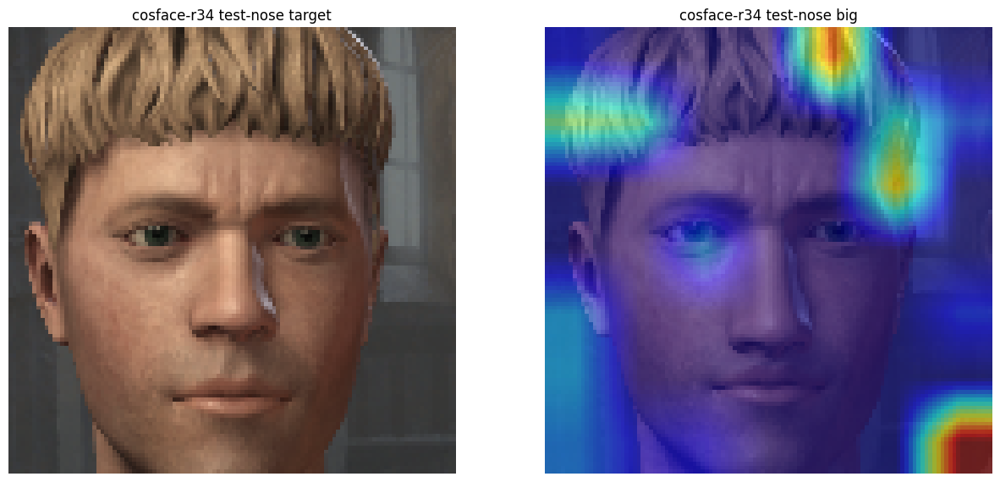

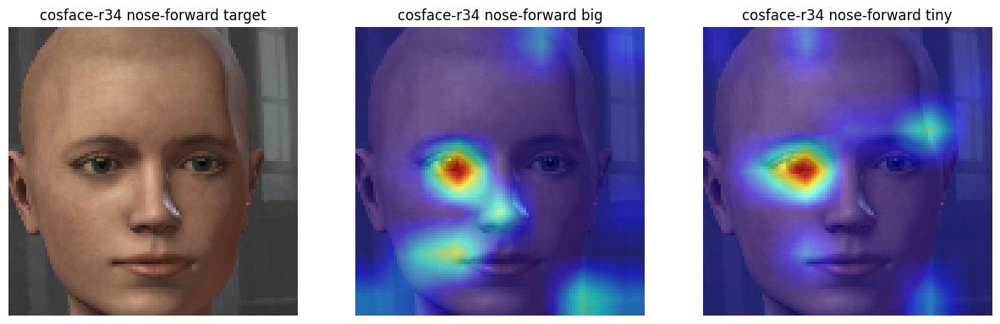

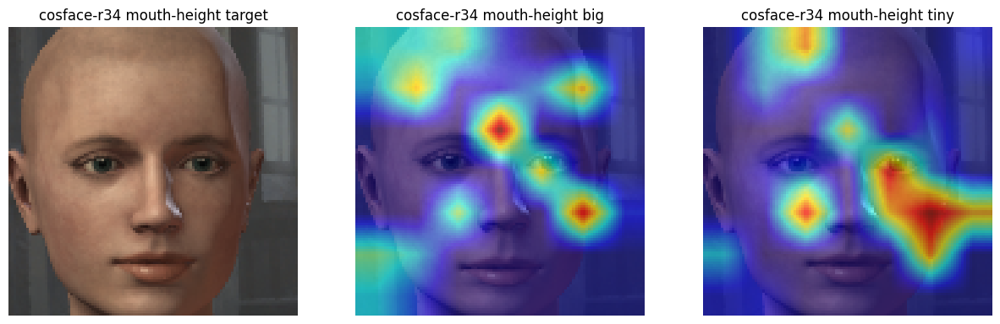

...

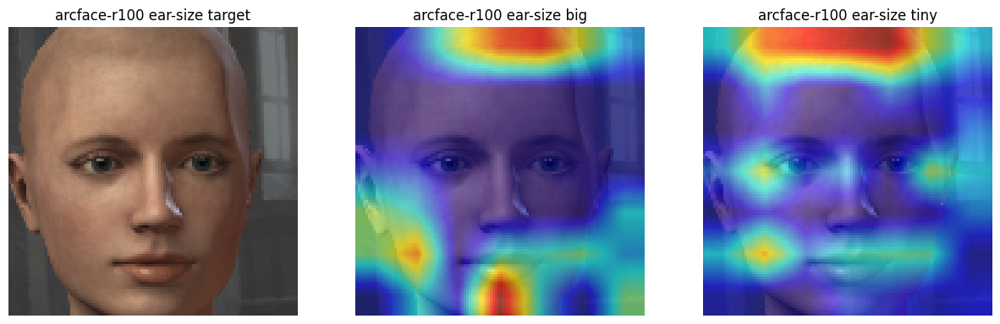

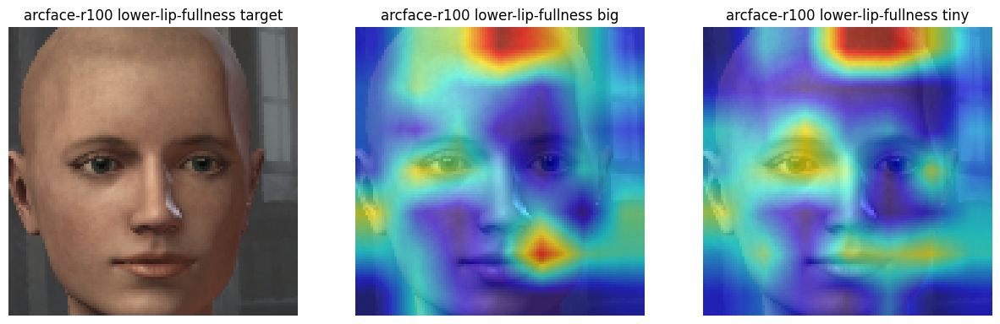

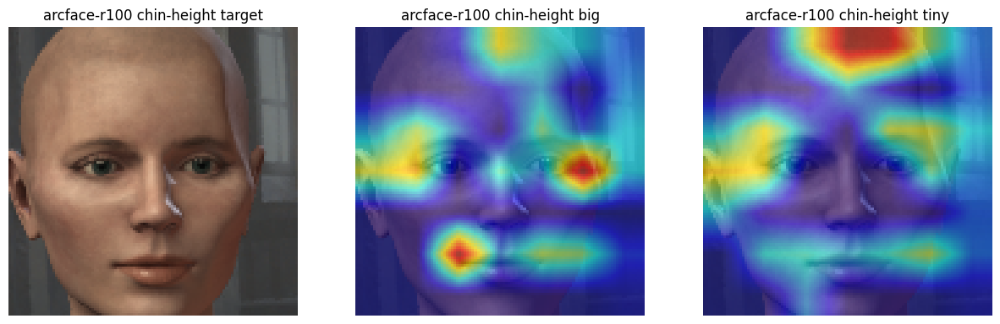

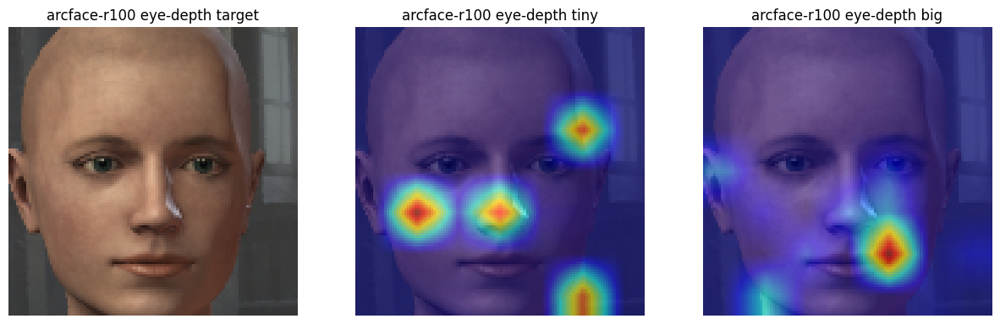

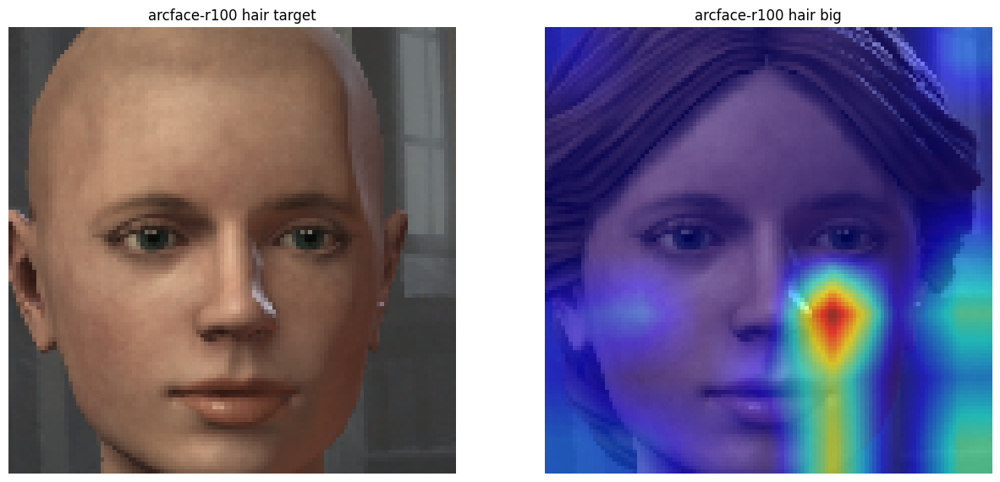

In [47]:
for (model, parameter), gradients in models2parameter2intensity2gradients.items():
    fig, axs = plt.subplots(1, len(gradients), figsize=(15, 10))
    for ax, (intensity, gradient) in zip(axs.flatten(), gradients.items()):
        ax.imshow(gradient)
        ax.axis("off")
        ax.set_title(f"{model} {parameter} {intensity}")
    plt.show()